The work was performed by:
1.   Sheikh Shah Mohammad Motiur Rahman
2.   Bogdan Gorelkin
---
# Mobility in Smart Cities Module
---

**Part 1**

---

# 1. Data pre-processing

To prepare your data before any processing, it is essential to work the dataset to obtain consistent
data that will not distort your analyses.

# a. Import the data
> * Import pandas as pd and csv libraries and load data sample of 7,733 rows as a
pandas dataframe.
>
> * Import datetime library and convert Unix timestamp to human friendly, python
readable, format. You can use pd.to_datetime.

In [ ]:
import warnings
warnings.filterwarnings('ignore')
'''Download the dataset here'''
!wget http://www.geolink.pt/ecmlpkdd2015-challenge/data/Porto_taxi_data_training.csv

--2020-11-23 17:15:40--  http://www.geolink.pt/ecmlpkdd2015-challenge/data/Porto_taxi_data_training.csv
Resolving www.geolink.pt (www.geolink.pt)... 137.116.202.253
Connecting to www.geolink.pt (www.geolink.pt)|137.116.202.253|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11567104 (11M) [text/csv]
Saving to: ‘Porto_taxi_data_training.csv’

Porto_taxi_data_tra 100%[===================>]  11.03M  11.6MB/s    in 0.9s    

2020-11-23 17:15:42 (11.6 MB/s) - ‘Porto_taxi_data_training.csv’ saved [11567104/11567104]



In [ ]:
'''Import necessary libraries here'''
import pandas as pd
from datetime import datetime
import datetime as dt
import json

In [ ]:
#cols = ['TRIP_ID', 'CALL_TYPE','ORIGIN_CALL','ORIGIN_STAND','TAXI_ID','TIMESTAMP','DAY_TYPE','MISSING_DATA','POLYLINE']
#data = pd.read_csv("Porto_taxi_data_training.csv", engine='python', error_bad_lines=False, header=0,names=cols)
data = pd.read_csv("Porto_taxi_data_training.csv", engine='python', error_bad_lines=False)

#here we will have 7734 lines because 1st is name line
#data.dtypes[data.dtypes == 'object']
'''for i in range(0,len(data['TIMESTAMP'])):
  ts = int(data['TIMESTAMP'][i])

  # if you encounter a "year is out of range" error the timestamp
  # may be in milliseconds, try `ts /= 1000` in that case
  data['TIMESTAMP'][i] = datetime.utcfromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S %p')'''
data.sort_values('TIMESTAMP',inplace = True)
data['year'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).year)
data['month'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).month) 
data['month_day'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).day) 
data['hour'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).hour) 
data['minute'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).minute) 
data['second'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).second) 
data['week_day'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.fromtimestamp(x).weekday()) 
data['datetime'] = data['TIMESTAMP'].apply(lambda x :dt.datetime.utcfromtimestamp(x).strftime('%b %d, %Y %H:%M:%S %p'))  
data.head()



Skipping line 7734: unexpected end of data


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,year,month,month_day,hour,minute,second,week_day,datetime
577,1372636853620000380,C,NaN,NaN,20000380,1372636853,A,False,"[[-8.610291, 41.140746], [-8.6103, 41.14075500...",2013,7,1,0,0,53,0,"Jul 01, 2013 00:00:53 AM"
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678, 41.151951], [-8.574705, 41.151942...",2013,7,1,0,0,54,0,"Jul 01, 2013 00:00:54 AM"
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643, 41.141412], [-8.618499, 41.141376...",2013,7,1,0,0,58,0,"Jul 01, 2013 00:00:58 AM"
10,1372636875620000233,C,NaN,NaN,20000233,1372636875,A,False,"[[-8.619894, 41.148009], [-8.620164, 41.14773]...",2013,7,1,0,1,15,0,"Jul 01, 2013 00:01:15 AM"
64,1372636896620000360,C,NaN,NaN,20000360,1372636896,A,False,"[[-8.617599, 41.146136999999996], [-8.61758100...",2013,7,1,0,1,36,0,"Jul 01, 2013 00:01:36 AM"


# b. Clean the data 
> To clean the data, we will remove instances with erroneous POLYLINE attribute. For
that purpose: 
> *  Delete rows where the attribute MISSING_DATA equals TRUE.
>
> *  Delete rows with less than 4 coordinates in the POLYLINE attribute (it means
that the destination is missing) using String formatting and eventually StringIO
library

To make sure the erroneous instances have been deleted, print the number of lines before
and after cleaning the data. 125 instances should have been removed.



In [ ]:
#Delete rows where the attribute MISSING_DATA equals TRUE

#indexNames = data[data['MISSING_DATA'] == "TRUE"].index

# Delete these row indexes from dataFrame
#data.drop(indexNames , inplace=True)

#data.drop(data[data['MISSING_DATA'] == True].index, inplace = True)
#data["POLYLINE"]
data = data[data.MISSING_DATA == False]

In [ ]:
'''Delete rows with less than 4 coordinates in the POLYLINE attribute (it means
that the destination is missing) using String formatting and eventually StringIO
library.'''
from io import StringIO

for i in range(0,len(data["POLYLINE"])):
  str = data["POLYLINE"][i];
  count = len(str.split(','));
  if count < 4:
    data.drop(i , inplace=True)
   
    
print(data.count())
data.dtypes


TRIP_ID         7607
CALL_TYPE       7607
ORIGIN_CALL     1844
ORIGIN_STAND    3883
TAXI_ID         7607
TIMESTAMP       7607
DAY_TYPE        7607
MISSING_DATA    7607
POLYLINE        7607
year            7607
month           7607
month_day       7607
hour            7607
minute          7607
second          7607
week_day        7607
datetime        7607
dtype: int64


TRIP_ID           int64
CALL_TYPE        object
ORIGIN_CALL     float64
ORIGIN_STAND    float64
TAXI_ID           int64
TIMESTAMP         int64
DAY_TYPE         object
MISSING_DATA       bool
POLYLINE         object
year              int64
month             int64
month_day         int64
hour              int64
minute            int64
second            int64
week_day          int64
datetime         object
dtype: object

In [ ]:
data["POLYLINE"]


577     [[-8.610291, 41.140746], [-8.6103, 41.14075500...
3       [[-8.574678, 41.151951], [-8.574705, 41.151942...
0       [[-8.618643, 41.141412], [-8.618499, 41.141376...
10      [[-8.619894, 41.148009], [-8.620164, 41.14773]...
64      [[-8.617599, 41.146136999999996], [-8.61758100...
                              ...                        
7726    [[-8.643716999999999, 41.161671000000005], [-8...
7610    [[-8.585829, 41.14836], [-8.58582, 41.14836], ...
7635    [[-8.615529, 41.140656], [-8.615511000000001, ...
7668    [[-8.630595, 41.15484], [-8.630550000000001, 4...
7724    [[-8.619849, 41.14806300000001], [-8.619885, 4...
Name: POLYLINE, Length: 7607, dtype: object

# c. Select the data
> * Select data from July 1st, 2013.
> * Import matplotlib.pyplot and plot the number of trips on July 1st hour by hour
> * Notice that there is a peak in traffic from 9:00 am to 9:59 am.
> * Select data representing trips starting on July 1st from 9:00 am to 9:59 am. In the
following, we will work with this sub dataset only.

In [ ]:
hours = pd.date_range('2013-07-01', periods=25, freq='H').strftime('%b %d, %Y %H:%M:%S %p')
print(hours[0])
print(hours[24])
# Select observations between two datetimes
hourly_data = data[(data['datetime'] > 'Jul 01, 2013 00:00:00 AM') & (data['datetime'] <= 'Jul 02, 2013 00:00:00 AM')]
#hourly_data.index
#data = data.set_index('datetime')
#data = pd.DataFrame(index = hours)

#You need to reshape your dataframe with hours as column headers
#data.set_index(hour, append=True)['POLYLINE'].unstack().plot.box()

# Delete these row indexes from dataFrame
#data.drop(indexNames , inplace=True)

print(hourly_data.count())
hourly_data.head()


Jul 01, 2013 00:00:00 AM
Jul 02, 2013 00:00:00 AM
TRIP_ID         4644
CALL_TYPE       4644
ORIGIN_CALL     1138
ORIGIN_STAND    2399
TAXI_ID         4644
TIMESTAMP       4644
DAY_TYPE        4644
MISSING_DATA    4644
POLYLINE        4644
year            4644
month           4644
month_day       4644
hour            4644
minute          4644
second          4644
week_day        4644
datetime        4644
dtype: int64


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,year,month,month_day,hour,minute,second,week_day,datetime
577,1372636853620000380,C,NaN,NaN,20000380,1372636853,A,False,"[[-8.610291, 41.140746], [-8.6103, 41.14075500...",2013,7,1,0,0,53,0,"Jul 01, 2013 00:00:53 AM"
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678, 41.151951], [-8.574705, 41.151942...",2013,7,1,0,0,54,0,"Jul 01, 2013 00:00:54 AM"
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643, 41.141412], [-8.618499, 41.141376...",2013,7,1,0,0,58,0,"Jul 01, 2013 00:00:58 AM"
10,1372636875620000233,C,NaN,NaN,20000233,1372636875,A,False,"[[-8.619894, 41.148009], [-8.620164, 41.14773]...",2013,7,1,0,1,15,0,"Jul 01, 2013 00:01:15 AM"
64,1372636896620000360,C,NaN,NaN,20000360,1372636896,A,False,"[[-8.617599, 41.146136999999996], [-8.61758100...",2013,7,1,0,1,36,0,"Jul 01, 2013 00:01:36 AM"


In [ ]:
hourly_data['datetime'] = pd.to_datetime(hourly_data['datetime'], errors='coerce', format='%b %d, %Y %H:%M:%S %p')

tripsPerHour = hourly_data.groupby(pd.Grouper(key='datetime', freq="1H")).TRIP_ID.count()
count_trips_per_hour = []
count_hour = []
for i in range(0,len(tripsPerHour)):
  print(hours[i])
  print(tripsPerHour[i])
  count_trips_per_hour.append(tripsPerHour[i])
  count_hour.append(hours[i])

Jul 01, 2013 00:00:00 AM
91
Jul 01, 2013 01:00:00 AM
56
Jul 01, 2013 02:00:00 AM
61
Jul 01, 2013 03:00:00 AM
92
Jul 01, 2013 04:00:00 AM
71
Jul 01, 2013 05:00:00 AM
82
Jul 01, 2013 06:00:00 AM
127
Jul 01, 2013 07:00:00 AM
271
Jul 01, 2013 08:00:00 AM
325
Jul 01, 2013 09:00:00 AM
391
Jul 01, 2013 10:00:00 AM
308
Jul 01, 2013 11:00:00 AM
252
Jul 01, 2013 12:00:00 PM
271
Jul 01, 2013 13:00:00 PM
301
Jul 01, 2013 14:00:00 PM
295
Jul 01, 2013 15:00:00 PM
287
Jul 01, 2013 16:00:00 PM
255
Jul 01, 2013 17:00:00 PM
237
Jul 01, 2013 18:00:00 PM
185
Jul 01, 2013 19:00:00 PM
176
Jul 01, 2013 20:00:00 PM
138
Jul 01, 2013 21:00:00 PM
153
Jul 01, 2013 22:00:00 PM
111
Jul 01, 2013 23:00:00 PM
108


[91, 56, 61, 92, 71, 82, 127, 271, 325, 391, 308, 252, 271, 301, 295, 287, 255, 237, 185, 176, 138, 153, 111, 108]
['Jul 01, 2013 00:00:00 AM', 'Jul 01, 2013 01:00:00 AM', 'Jul 01, 2013 02:00:00 AM', 'Jul 01, 2013 03:00:00 AM', 'Jul 01, 2013 04:00:00 AM', 'Jul 01, 2013 05:00:00 AM', 'Jul 01, 2013 06:00:00 AM', 'Jul 01, 2013 07:00:00 AM', 'Jul 01, 2013 08:00:00 AM', 'Jul 01, 2013 09:00:00 AM', 'Jul 01, 2013 10:00:00 AM', 'Jul 01, 2013 11:00:00 AM', 'Jul 01, 2013 12:00:00 PM', 'Jul 01, 2013 13:00:00 PM', 'Jul 01, 2013 14:00:00 PM', 'Jul 01, 2013 15:00:00 PM', 'Jul 01, 2013 16:00:00 PM', 'Jul 01, 2013 17:00:00 PM', 'Jul 01, 2013 18:00:00 PM', 'Jul 01, 2013 19:00:00 PM', 'Jul 01, 2013 20:00:00 PM', 'Jul 01, 2013 21:00:00 PM', 'Jul 01, 2013 22:00:00 PM', 'Jul 01, 2013 23:00:00 PM']


[Text(0, 0, 'Jul 01, 2013 00:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 01:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 02:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 03:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 04:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 05:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 06:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 07:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 08:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 09:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 10:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 11:00:00 AM'),
 Text(0, 0, 'Jul 01, 2013 12:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 13:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 14:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 15:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 16:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 17:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 18:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 19:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 20:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 21:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 22:00:00 PM'),
 Text(0, 0, 'Jul 01, 2013 23:00:00 PM')]

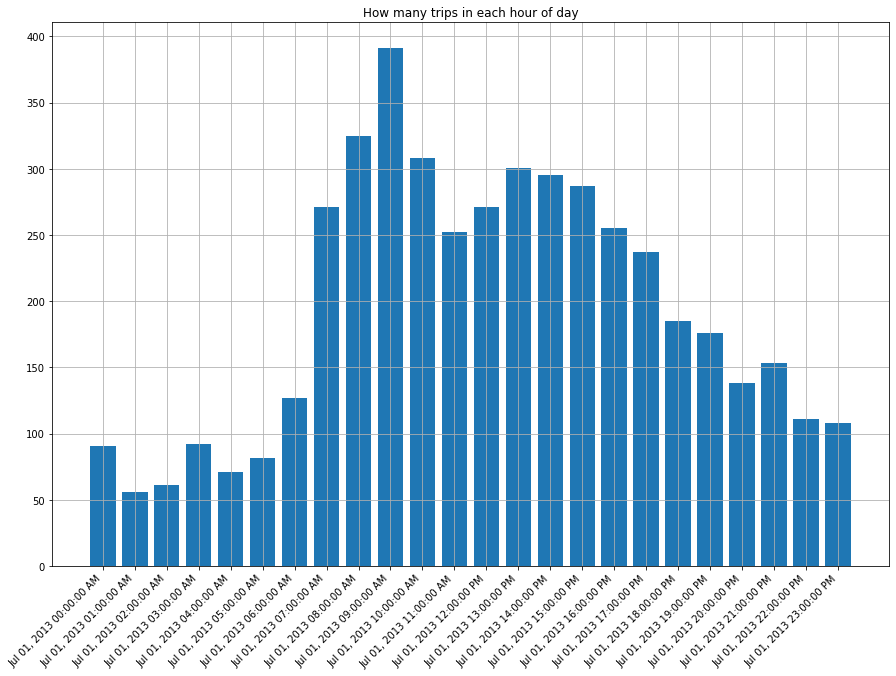

In [ ]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(figsize=(15,10))

print(count_trips_per_hour)
print(count_hour)
plt.title("How many trips in each hour of day")
plt.grid(True)
plt.bar(count_hour,count_trips_per_hour)
ax.set_xticklabels(hours, rotation=45, ha='right')
#plt.hist(zzz)  
#for i in range(0,len(tripsPerHour)):
 # fig.


In [ ]:

selected_data = hourly_data[(hourly_data['datetime'] > 'Jul 01, 2013 09:00:00 AM') & (hourly_data['datetime'] <= 'Jul 01, 2013 09:59:59 AM')]
#selected_data.astype(str)
#hourly_data['datetime'] = pd.to_datetime(hourly_data['datetime'], errors='coerce', format='%b %d, %Y %H:%M:%S %p')

#selected_data = selected_data[hourly_data.groupby(pd.Grouper(key='datetime', freq="1H"))]

#selected_data = hourly_data.groupby(pd.Grouper(key='datetime', freq="1H"))
#selected_data.head()
#selected_data.count()

# d. Format the data for QGIS
> * Extract the origins and destinations coordinates using String formatting and
eventually StringIO library, and add columns origin_longitude, origin_latitude,
destination_longitude, destination_latitude to dataframe.
> * Export dataframe with origin and destination coordinates to csv file:
"origins_destinations.csv".


In [ ]:

selected_data['TRAJECTORY'] = json.loads('[' + selected_data.POLYLINE.str.cat(sep=',') + ']')

selected_data["ORIGIN"] = selected_data['TRAJECTORY'].apply(lambda x: x[0])
selected_data["origin_latitude"] = selected_data['TRAJECTORY'].apply(lambda x: x[0][1])
selected_data["origin_longitude"] = selected_data['TRAJECTORY'].apply(lambda x: x[0][0])
selected_data["DESTINATION"] = selected_data["TRAJECTORY"].apply(lambda x: x[len(x)-1])
selected_data["destination_latitude"] = selected_data["TRAJECTORY"].apply(lambda x: x[len(x)-1][1])
selected_data["destination_longitude"] = selected_data["TRAJECTORY"].apply(lambda x: x[len(x)-1][0])

#selected_data.head(100)
selected_data.to_csv("origins_destinations.csv")
selected_data.head()


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,year,month,month_day,hour,minute,second,week_day,datetime,TRAJECTORY,ORIGIN,origin_latitude,origin_longitude,DESTINATION,destination_latitude,destination_longitude
1158,1372669201620000663,B,NaN,15.0,20000663,1372669201,A,False,"[[-8.585757000000001, 41.14856699999999], [-8....",2013,7,1,9,0,1,0,2013-07-01 09:00:01,"[[-8.585757000000001, 41.14856699999999], [-8....","[-8.585757000000001, 41.14856699999999]",41.148567,-8.585757,"[-8.644760999999999, 41.160384]",41.160384,-8.644761
1021,1372669213620000126,B,NaN,13.0,20000126,1372669213,A,False,"[[-8.628426, 41.15779200000001], [-8.628066, 4...",2013,7,1,9,0,13,0,2013-07-01 09:00:13,"[[-8.628426, 41.15779200000001], [-8.628066, 4...","[-8.628426, 41.15779200000001]",41.157792,-8.628426,"[-8.639883000000001, 41.161221000000005]",41.161221,-8.639883
1317,1372669232620000289,A,11079.0,NaN,20000289,1372669232,A,False,"[[-8.644752, 41.171247], [-8.644760999999999, ...",2013,7,1,9,0,32,0,2013-07-01 09:00:32,"[[-8.644752, 41.171247], [-8.644760999999999, ...","[-8.644752, 41.171247]",41.171247,-8.644752,"[-8.64936, 41.167395000000006]",41.167395,-8.649360
1183,1372669243620000152,A,2002.0,NaN,20000152,1372669243,A,False,"[[-8.610048, 41.15296800000001], [-8.610048, 4...",2013,7,1,9,0,43,0,2013-07-01 09:00:43,"[[-8.610048, 41.15296800000001], [-8.610048, 4...","[-8.610048, 41.15296800000001]",41.152968,-8.610048,"[-8.670033, 41.236605000000004]",41.236605,-8.670033
1354,1372669254620000560,B,NaN,61.0,20000560,1372669254,A,False,"[[-8.599311, 41.149179000000004], [-8.598888, ...",2013,7,1,9,0,54,0,2013-07-01 09:00:54,"[[-8.599311, 41.149179000000004], [-8.598888, ...","[-8.599311, 41.149179000000004]",41.149179,-8.599311,"[-8.583174, 41.173893]",41.173893,-8.583174


# 2. Data visualisation
Visualizing the results is an important step in this line of work. You are asked to visualize the data
through QGIS tool by following the steps below.


# a. Create the project and add a raster map
> * Open QGIS and create a new project. Save it as "mobility.qgz" in your preferred
folder.
> * Add an Open Street Map layer by selecting in the menu:
Web>QuickMapServices>OSM>OSM Standard.
> * You can manage your layers in the layers panel on the left

# b. Visualize the origins or departures locations
> * Select Layer>Add Layer>Add Delimited Text Layer…
> * Select the "origins_destinations.csv" file, write "origins" as the Layer name and select
the corresponding file format.
> * In Geometry definition, check Point coordinates and choose ORIGIN_LONGITUDE
as X field and ORIGIN_LATITUDE as Y field.
> * Make sure the Geometry CRS is EPSG:4326 – WGS 84.
> * Click Add, then close the window.
> * Zoom in on the map on Porto, Portugal using the magnifying glass tool in the top
toolbar 

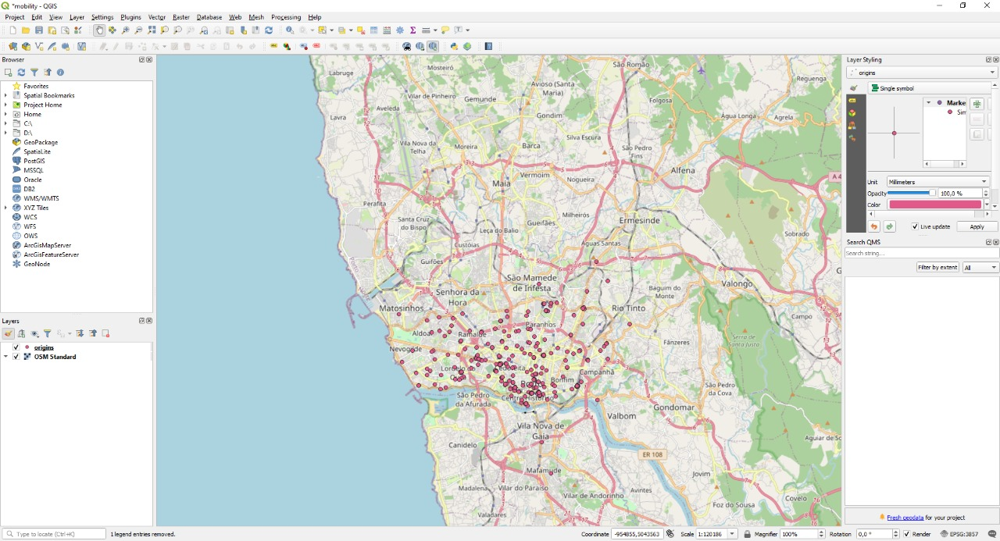



# c. Display origins or departures heatmap
> * In the layer panel, right click on the "origins" layer and select Properties.
> * Choose Symbology in the left panel and select Heatmap in the top drop-down menu
> * For Colour ramp, choose Spectral, and then, again in Colour ramp, click Invert Colour
Ramp.
> * Expand the Layer Rendering tab and select a 50% opacity.
> * Click OK.
> * Notice that there are two important departure hubs. Using the magnifier in the bottom
toolbar, identify the hubs as the Porto-Campanhã and Porto-São Bento railway
stations.

Porto-Campanhã
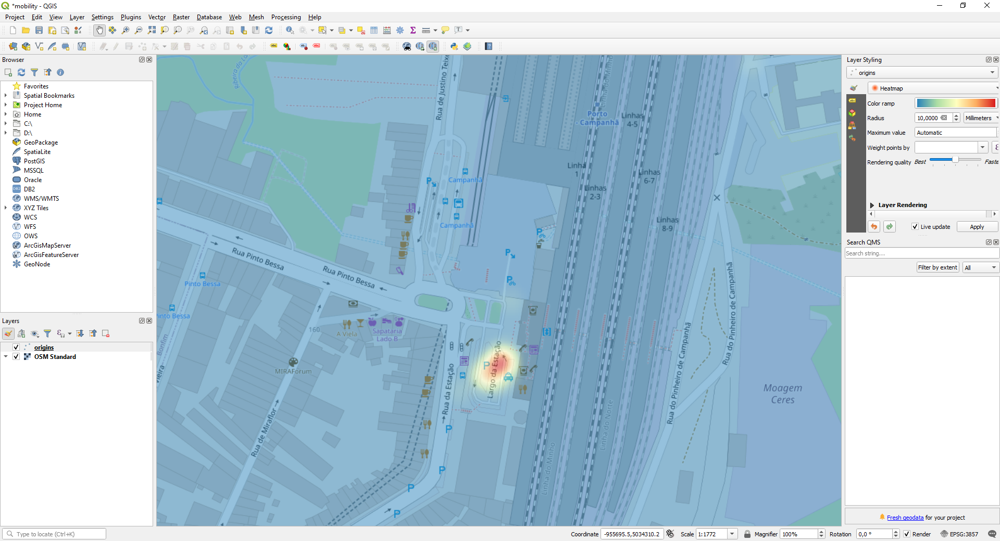

Porto-São Bento
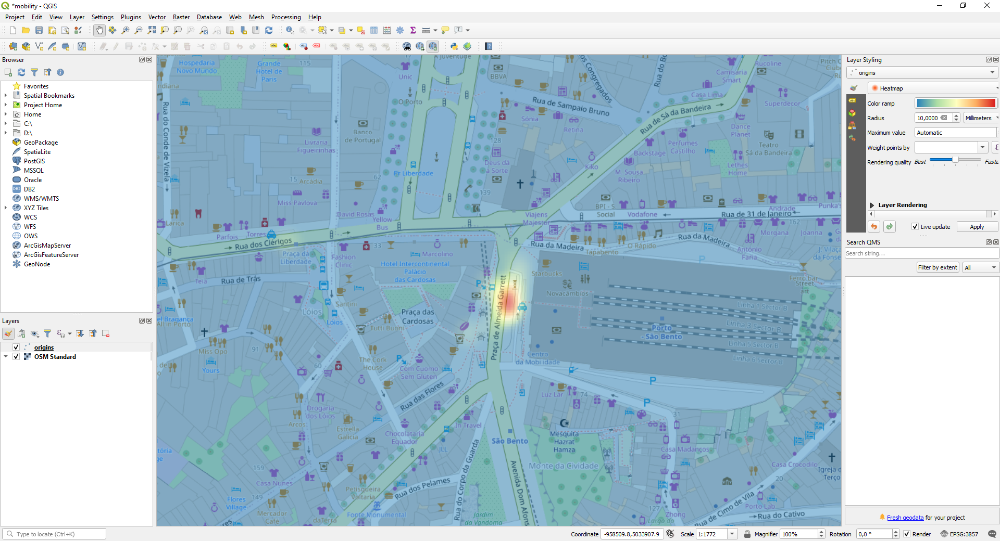

# d. Visualize the destinations or arrivals locations and display their heatmap
> * Same steps as before but be careful to choose this time
DESTINATION_LONGITUDE as X field and DESTINATION_LATITUDE as Y field, in
Geometry definition, when adding the delimited text layer.
> * Notice that there are two important destination hubs. Using the magnifier in the
bottom toolbar, identify the hubs as Porto city centre and Porto airport.




 Porto city centre
 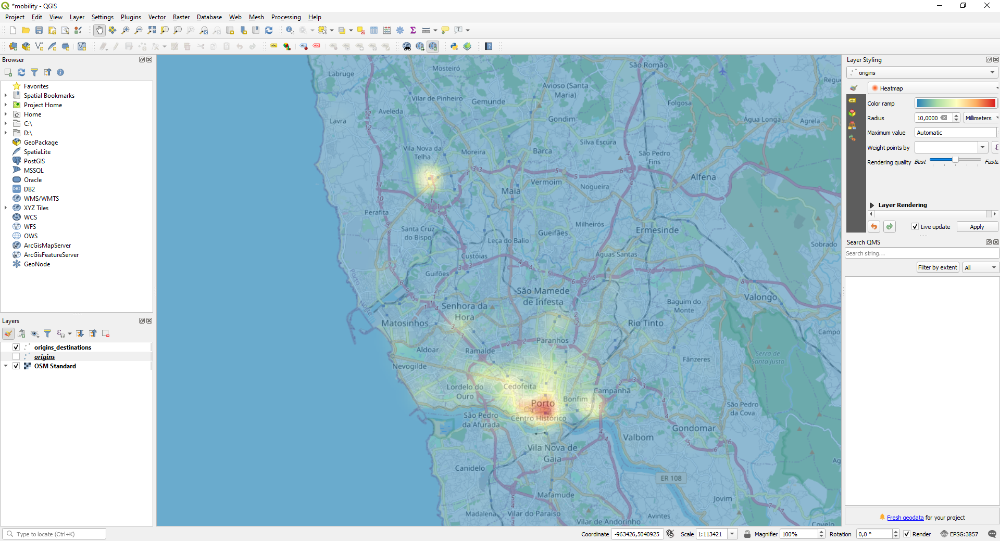

Porto airport
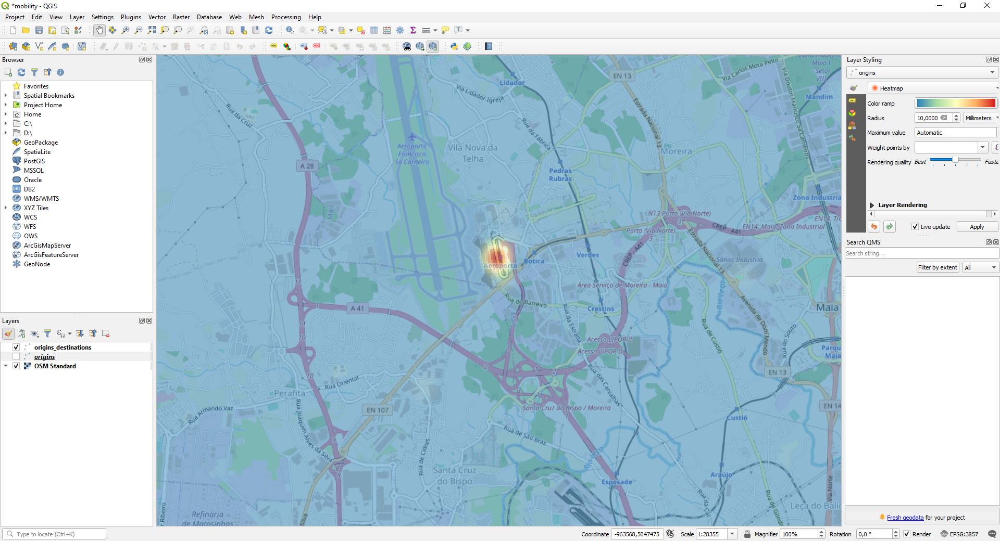

---

# Part II

---



# 1. Data pre-processing
You can proceed with the same pre-processed data of part I.

# a. Extract origins and destinations
> * Extract the origins and destinations coordinates using String formatting and
eventually StringIO library, and add columns origin_longitude, origin_latitude,
destination_longitude, destination_latitude to dataframe


In [ ]:
df = pd.read_csv("origins_destinations.csv", engine='python', error_bad_lines=False)
df.head()


,Unnamed: 0,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,year,month,month_day,hour,minute,second,week_day,datetime,TRAJECTORY,ORIGIN,origin_latitude,origin_longitude,DESTINATION,destination_latitude,destination_longitude
0,1158,1372669201620000663,B,NaN,15.0,20000663,1372669201,A,False,"[[-8.585757000000001, 41.14856699999999], [-8....",2013,7,1,9,0,1,0,2013-07-01 09:00:01,"[[-8.585757000000001, 41.14856699999999], [-8....","[-8.585757000000001, 41.14856699999999]",41.148567,-8.585757,"[-8.644760999999999, 41.160384]",41.160384,-8.644761
1,1021,1372669213620000126,B,NaN,13.0,20000126,1372669213,A,False,"[[-8.628426, 41.15779200000001], [-8.628066, 4...",2013,7,1,9,0,13,0,2013-07-01 09:00:13,"[[-8.628426, 41.15779200000001], [-8.628066, 4...","[-8.628426, 41.15779200000001]",41.157792,-8.628426,"[-8.639883000000001, 41.161221000000005]",41.161221,-8.639883
2,1317,1372669232620000289,A,11079.0,NaN,20000289,1372669232,A,False,"[[-8.644752, 41.171247], [-8.644760999999999, ...",2013,7,1,9,0,32,0,2013-07-01 09:00:32,"[[-8.644752, 41.171247], [-8.644760999999999, ...","[-8.644752, 41.171247]",41.171247,-8.644752,"[-8.64936, 41.167395000000006]",41.167395,-8.649360
3,1183,1372669243620000152,A,2002.0,NaN,20000152,1372669243,A,False,"[[-8.610048, 41.15296800000001], [-8.610048, 4...",2013,7,1,9,0,43,0,2013-07-01 09:00:43,"[[-8.610048, 41.15296800000001], [-8.610048, 4...","[-8.610048, 41.15296800000001]",41.152968,-8.610048,"[-8.670033, 41.236605000000004]",41.236605,-8.670033
4,1354,1372669254620000560,B,NaN,61.0,20000560,1372669254,A,False,"[[-8.599311, 41.149179000000004], [-8.598888, ...",2013,7,1,9,0,54,0,2013-07-01 09:00:54,"[[-8.599311, 41.149179000000004], [-8.598888, ...","[-8.599311, 41.149179000000004]",41.149179,-8.599311,"[-8.583174, 41.173893]",41.173893,-8.583174


In [ ]:
df = df.drop(columns=['Unnamed: 0'])

In [ ]:
new_df = df.drop(columns=['TRIP_ID','CALL_TYPE','ORIGIN_CALL','ORIGIN_STAND','TAXI_ID','TIMESTAMP','DAY_TYPE','MISSING_DATA','POLYLINE','year','month','month_day','hour','minute','second','week_day','datetime','TRAJECTORY','ORIGIN','DESTINATION'])

In [ ]:
new_df.head()

,origin_latitude,origin_longitude,destination_latitude,destination_longitude
0,41.148567,-8.585757,41.160384,-8.644761
1,41.157792,-8.628426,41.161221,-8.639883
2,41.171247,-8.644752,41.167395,-8.649360
3,41.152968,-8.610048,41.236605,-8.670033
4,41.149179,-8.599311,41.173893,-8.583174


# b. Convert origin and destination longitudes and latitudes into cartesian coordinates
> * Install pyproj and from pyproj, import Proj, transform
> * Transform origin and destination coordinates from EPSG:4326 to EPSG:5018 by
adding new columns ORIGIN_X, ORIGIN_Y, DESTINATION_X, DESTINATION_Y to
the dataframe. Running this operation takes some time.

In [ ]:
 !pip install pyproj
 from pyproj import Proj, transform

ORIGIN_X_arr = []
ORIGIN_Y_arr = []
DESTINATION_X_arr = []
DESTINATION_Y_arr = []
print("Converting")
for i in range(0,len(new_df['origin_longitude'])):
        
        to_c = Proj(init=' EPSG:5018')
        from_c = Proj(init='EPSG:4326')
        ORIGIN_X, ORIGIN_Y = transform(from_c, to_c, new_df['origin_longitude'][i],new_df['origin_latitude'][i])
        ORIGIN_X_arr.append(ORIGIN_X)
        ORIGIN_Y_arr.append(ORIGIN_Y)
print("Finished Origin")
print("Converting")
for j in range(0,len(new_df['destination_longitude'])):
        #print("Converting",new_df['destination_longitude'][j])
        to_c = Proj(init=' EPSG:5018')
        from_c = Proj(init='EPSG:4326')
        DESTINATION_X, DESTINATION_Y = transform(from_c, to_c, new_df['destination_longitude'][j],new_df['destination_latitude'][j])
        DESTINATION_X_arr.append(DESTINATION_X)
        DESTINATION_Y_arr.append(DESTINATION_Y)
print("Finished Destination")

     |████████████████████████████████| 6.5MB 6.4MB/s 
Converting
Finished Origin
Converting
Finished Destination


In [ ]:
new_df['ORIGIN_X'] = ORIGIN_X_arr
new_df['ORIGIN_Y'] = ORIGIN_Y_arr
new_df['DESTINATION_X'] = DESTINATION_X_arr
new_df['DESTINATION_Y'] = DESTINATION_Y_arr
new_df.head()

,origin_latitude,origin_longitude,destination_latitude,destination_longitude,ORIGIN_X,ORIGIN_Y,DESTINATION_X,DESTINATION_Y
0,41.148567,-8.585757,41.160384,-8.644761,-37997.993328,164478.500352,-42943.514007,165818.346163
1,41.157792,-8.628426,41.161221,-8.639883,-41574.115980,165522.542064,-42533.549314,165908.905017
2,41.171247,-8.644752,41.167395,-8.649360,-42935.658998,167024.778671,-43324.896638,166599.264137
3,41.152968,-8.610048,41.236605,-8.670033,-40034.482311,164978.169332,-45012.349648,174296.237321
4,41.149179,-8.599311,41.173893,-8.583174,-39135.453746,164552.479527,-37766.596092,167290.056492


# c. Clustering with K-means
> * To cluster the origins, create a new dataframe, origins, with ORIGIN_X and
ORIGIN_Y as its columns
> * From sklearn.cluster, import KMeans. Set K-means parameters as follows: "kmeans
= KMeans(n_clusters=14, init='random', n_init=100, max_iter=300)" with n_clusters
being the number of clusters, init the method of initialization for initial centroids, n_init
the number of time the k-means algorithm will be run with different centroid seeds
and max_iter the maximum number of iterations for a single run.
> * Use kmeans.fit_predict to add a column with the cluster ID for each origin:
" origin_clusters = origins
 origin_clusters["cluster_ID"] = kmeans.fit_predict(origins) "
> * Save as csv file "origin_clusters.csv"
> * Repeat the same steps for the destinations.


In [ ]:
origins = new_df.drop(columns=['origin_latitude','origin_longitude','destination_latitude','destination_longitude','DESTINATION_X','DESTINATION_Y'])
origins.head()

,ORIGIN_X,ORIGIN_Y
0,-37997.993328,164478.500352
1,-41574.115980,165522.542064
2,-42935.658998,167024.778671
3,-40034.482311,164978.169332
4,-39135.453746,164552.479527


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=14, init='random', n_init=100, max_iter=300)
origin_clusters = origins
origin_clusters["cluster_ID"] = kmeans.fit_predict(origins)

origin_clusters.to_csv('origin_clusters.csv')

In [ ]:
destinations = new_df.drop(columns=['origin_latitude','origin_longitude','destination_latitude','destination_longitude','ORIGIN_X','ORIGIN_Y'])
destinations.head()

,DESTINATION_X,DESTINATION_Y
0,-42943.514007,165818.346163
1,-42533.549314,165908.905017
2,-43324.896638,166599.264137
3,-45012.349648,174296.237321
4,-37766.596092,167290.056492


In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=14, init='random', n_init=100, max_iter=300)
destination_clusters = destinations
destination_clusters["cluster_ID"] = kmeans.fit_predict(destinations)

destination_clusters.to_csv('destination_clusters.csv')

# 3. Data visualisation
Here again, you are asked to visualize the data through QGIS tool by following the steps below.

# a. Create the project and add a raster map
> * Open QGIS and create a new project. Save it as "mobility.qgz" in your preferred
folder.
> * Add an Open Street Map layer by selecting in the menu:
Web>QuickMapServices>OSM>OSM Standard.
You can manage your layers in the layers panel on the left.

# b. Visualize the origins or destinations locations
> * Select Layer>Add Layer>Add Delimited Text Layer…
> * Select the "origin_clusters.csv" file and choose the corresponding file format.
> * In Geometry definition, check Point coordinates and choose origin_X as X field and
ORIGIN_Y as Y field.
> * Make sure to choose EPSG:5018 as the Geometry CRS by clicking the Select CRS
button and using the search field.
> * Click Add, then close the window.
> * Zoom in on the map on Porto, Portugal using the magnifying glass tool in the top
toolbar
> * Repeat the same steps for destinations


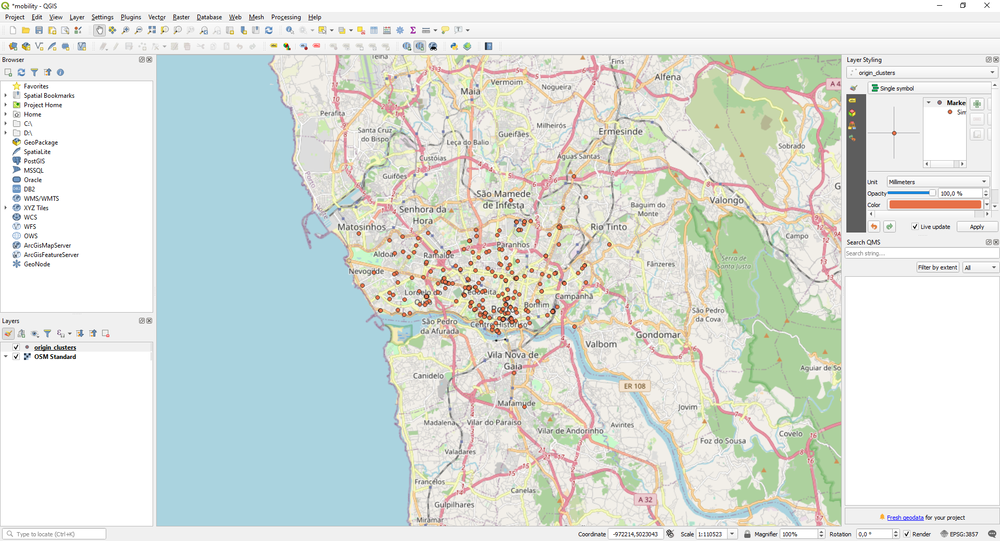

 Classify to display the clusters
 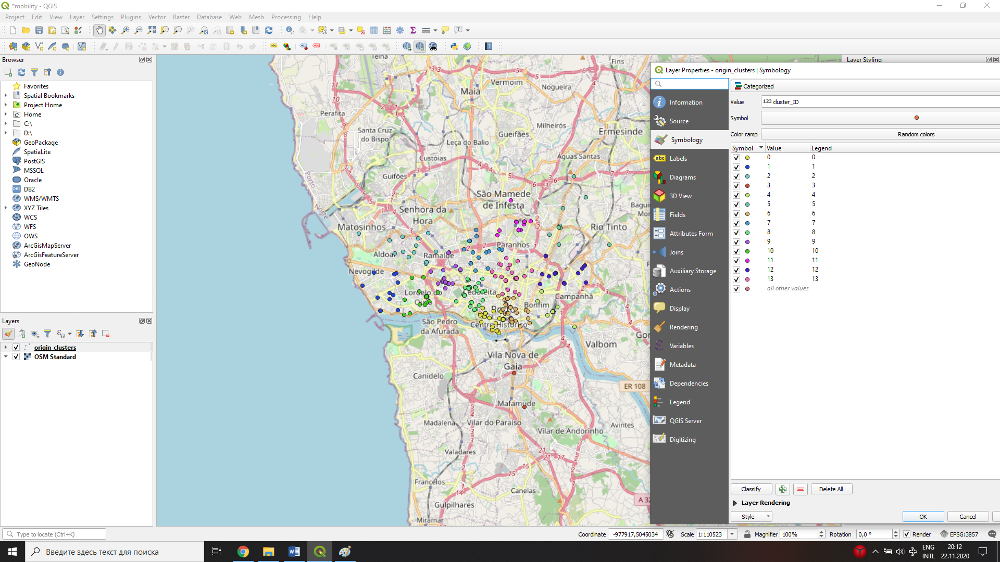

# the same steps for destinations

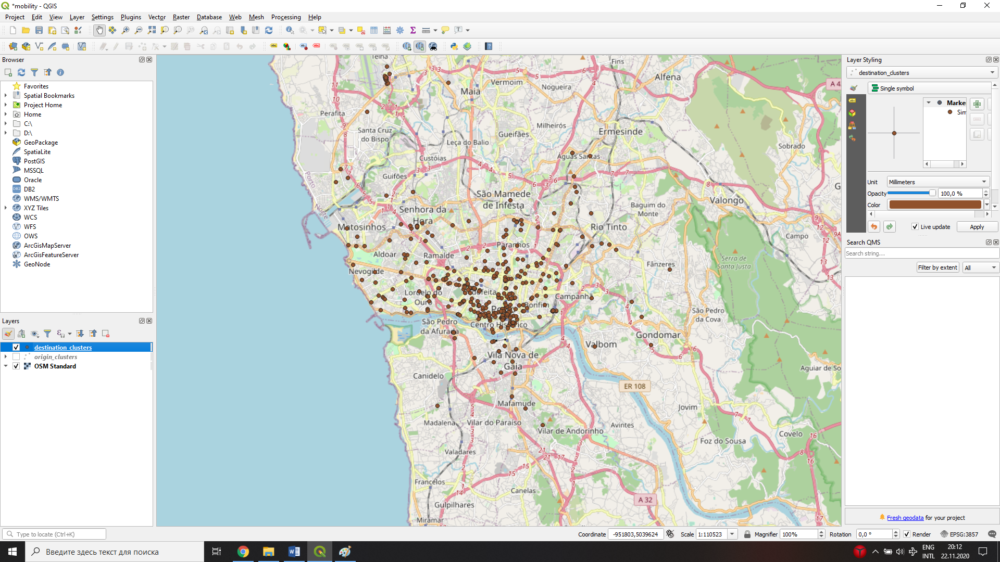


 Classify to display the clusters
 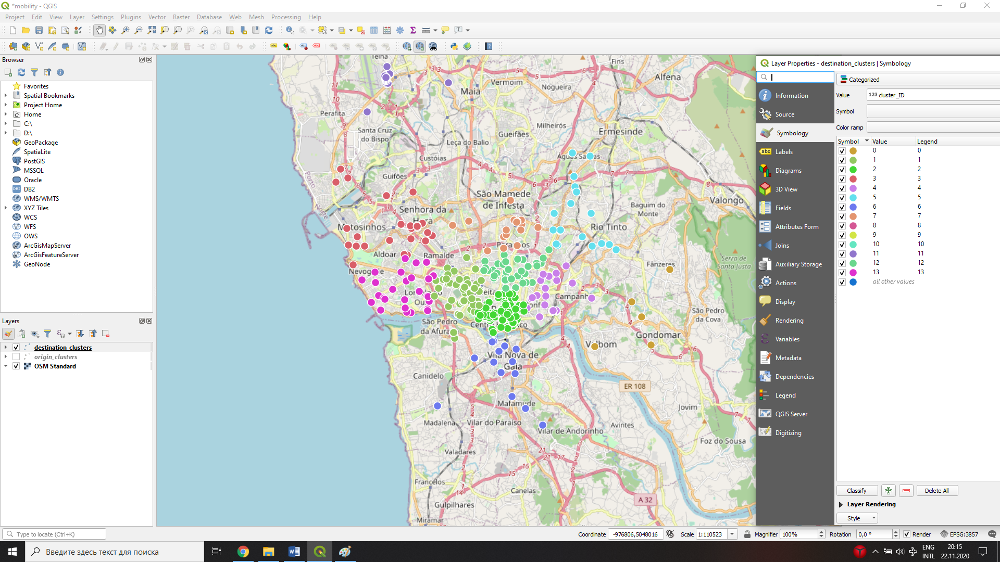